In [ ]:
!pip install segmentation-models-pytorch albumentations torch torchvision matplotlib timm torchmetrics tqdm tensorboard > /dev/null 2>&1

In [ ]:
!pip install --upgrade segmentation-models-pytorch > /dev/null 2>&1

In [ ]:
!nvidia-smi

Sun May  4 15:13:21 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   30C    P0             44W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"


In [ ]:
from google.colab import drive
import pandas as pd
import torch
import numpy as np
from torchmetrics import JaccardIndex, Accuracy, Precision, Recall, F1Score, ConfusionMatrix
import cv2
import numpy as np
import torch
import albumentations as A
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.cuda.amp import GradScaler, autocast
import random
from matplotlib import pyplot as plt
import warnings
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime
import seaborn as sns

warnings.filterwarnings("ignore")
%matplotlib inline

%load_ext tensorboard


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.6' (you have '2.0.5'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
import torch
import gc

gc.collect()
torch.cuda.empty_cache()


print(f"Allocated: {torch.cuda.memory_allocated() / 1024**3:.2f} GB")
print(f"Cached: {torch.cuda.memory_reserved() / 1024**3:.2f} GB")

Allocated: 0.00 GB
Cached: 0.00 GB


In [ ]:
drive.mount('/content/drive')

# Dataset path located in Google Drive
GDRIVE_PATH = "/content/drive/MyDrive/finalyearproject/"
DATASET_DIR = os.path.join(GDRIVE_PATH, "deepglobe816")
SAVE_DIR = os.path.join(GDRIVE_PATH, "save")

Mounted at /content/drive


In [ ]:
save_base_path = os.path.join(GDRIVE_PATH, "save-resnet101-816-may4-25val")
os.makedirs(save_base_path, exist_ok=True)
!ls /content/drive/MyDrive/finalyearproject/save-resnet101-816-may4-25val

In [ ]:
metadata_path = os.path.join(DATASET_DIR, "metadata.csv")
class_dict_path = os.path.join(DATASET_DIR, "class_dict.csv")

metadata_df = pd.read_csv(metadata_path)
class_dict_df = pd.read_csv(class_dict_path)

print("Metadata Sample:\n", metadata_df.head())
print("\nClass Dictionary:\n", class_dict_df.head(8))

Metadata Sample:
     image_id                 mask_path           sat_image_path
0   100694_0   train/100694_mask_0.png   train/100694_sat_0.jpg
1   100694_1   train/100694_mask_1.png   train/100694_sat_1.jpg
2  100694_10  train/100694_mask_10.png  train/100694_sat_10.jpg
3  100694_11  train/100694_mask_11.png  train/100694_sat_11.jpg
4  100694_12  train/100694_mask_12.png  train/100694_sat_12.jpg

Class Dictionary:
                name    r    g    b
0        urban_land    0  255  255
1  agriculture_land  255  255    0
2         rangeland  255    0  255
3       forest_land    0  255    0
4             water    0    0  255
5       barren_land  255  255  255
6           unknown    0    0    0


In [ ]:
class_colors = {
    i: (row['r'], row['g'], row['b'])
    for i, row in class_dict_df.iterrows()
}

print("Class Color Mapping:", class_colors)

Class Color Mapping: {0: (0, 255, 255), 1: (255, 255, 0), 2: (255, 0, 255), 3: (0, 255, 0), 4: (0, 0, 255), 5: (255, 255, 255), 6: (0, 0, 0)}


In [ ]:
class_proportions = np.array([9.35, 56.76, 10.21, 13.75, 3.74, 6.14, 0.04])

raw_class_weights = 1.0 / class_proportions

normalized_class_weights = raw_class_weights / np.min(raw_class_weights)


class_weights_tensor = torch.tensor(normalized_class_weights, dtype=torch.float).cuda()

#class 6 is ignored
class_weights_tensor[6] = 0.0
class_weights_tensor

tensor([ 6.0706,  1.0000,  5.5593,  4.1280, 15.1765,  9.2443,  0.0000],
       device='cuda:0')

In [ ]:

def set_split(validation_percentage=0.2, metadata_path = metadata_path):
    """
    Splits a metadata CSV into training and validation sets, ensuring that samples
    from the same group (identified via mask path) are split together.

    Args:
        validation_percentage (float): Proportion of data to use for validation within each group.
        metadata_path (str): Path to the CSV file containing metadata with a 'mask_path' column.

    Returns:
        train_df (pd.DataFrame): DataFrame containing training samples.
        validation_df (pd.DataFrame): DataFrame containing validation samples.
    """

  metadata_df = pd.read_csv(metadata_path)
  metadata_df['group_id'] = metadata_df['mask_path'].apply(lambda x: x.split('/')[-1].split('_mask_')[0])
  val_indices = []

  for group, group_df in metadata_df.groupby('group_id'):
      n_val = max(1, int(len(group_df) * validation_percentage))
      val_sample = group_df.sample(n=n_val, random_state=42)
      val_indices.extend(val_sample.index.tolist())

  metadata_df['split'] = 'train'
  metadata_df.loc[val_indices, 'split'] = 'validation'
  metadata_df.drop(columns='group_id', inplace=True)

  validation_df = metadata_df[metadata_df['split'] == 'validation']
  train_df = metadata_df[metadata_df['split'] == 'train']

  return train_df, validation_df

In [ ]:
def rgb_to_class(mask, class_dict):
    """
    Converts an RGB-encoded segmentation mask into a 2D class index mask.

    Args:
        mask (np.ndarray): The RGB mask image as a NumPy array of shape (H, W, 3).
        class_dict (pd.DataFrame): A DataFrame where each row corresponds to a class,
                                   with columns 'r', 'g', 'b' defining the RGB values.

    Returns:
        mask_class (np.ndarray): A 2D NumPy array of shape (H, W), where each pixel contains
                                 the class index corresponding to its RGB color.
    """

    mask_class = np.zeros(mask.shape[:2], dtype=np.uint8)
    for i, row in class_dict.iterrows():
        r, g, b = row[['r', 'g', 'b']]
        class_index = i
        mask_class[np.all(mask == [r, g, b], axis=-1)] = class_index
    return mask_class

In [ ]:
def one_hot_encode(mask, num_classes):
    return torch.nn.functional.one_hot(mask, num_classes=num_classes).permute(2, 0, 1).long()

def one_hot_decode(mask_one_hot):
    return torch.argmax(mask_one_hot, dim=0).byte()

In [ ]:
class DeepGlobeDataset(Dataset):
    def __init__(self, metadata, dataset_dir, class_dict, transform=None):
        self.metadata = metadata
        self.dataset_dir = dataset_dir
        self.class_dict = class_dict
        self.transform = transform

    def __len__(self):
        return len(self.metadata)

    def __getitem__(self, idx):
        row = self.metadata.iloc[idx]

        img_path = os.path.join(self.dataset_dir, str(row['sat_image_path']))
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        mask_path = os.path.join(self.dataset_dir, str(row['mask_path']))
        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        mask = rgb_to_class(mask, self.class_dict)

        if self.transform:
            transformed = self.transform(image=image, mask=mask)
            image, mask = transformed["image"], transformed["mask"]


        image = torch.tensor(np.array(image, dtype=np.float32))
        mask = torch.tensor(np.array(mask, dtype=np.int64))

        return image, mask

In [ ]:
def augmentation():
    train_transform = [
        A.HorizontalFlip(p=0.3),
        A.VerticalFlip(p=0.3),
        A.Rotate(limit=20, p=0.35, border_mode=cv2.BORDER_CONSTANT, fill_mask=6, fill=(0,0,0)), #unkown class index is 6
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=30, p=0.5, fill_mask=6, fill=(0,0,0)),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), #ImageNet normalization
        ToTensorV2()
    ]
    return A.Compose(train_transform)

In [ ]:
def augmentation_val():
    train_transform = [
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), #ImageNet normalization
        ToTensorV2()
        ]
    return A.Compose(train_transform)

In [ ]:
train_df, validation_df = set_split(validation_percentage=0.25)
dataset = DeepGlobeDataset(train_df, DATASET_DIR, class_dict_df, transform=augmentation())
val_dataset = DeepGlobeDataset(validation_df, DATASET_DIR, class_dict_df, transform=augmentation_val())

torch.int64
tensor([[1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        ...,
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1],
        [1, 1, 1,  ..., 1, 1, 1]])


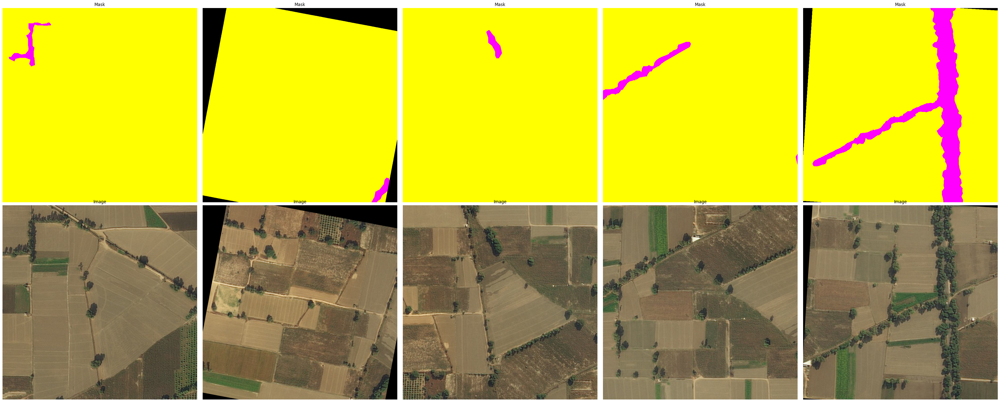

In [ ]:
# Converts a 2D mask of class indices into a color-coded RGB mask for visualization.
def colorize_mask(mask, class_colors):
    h, w = mask.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)

    for class_idx, color in class_colors.items():
        color_mask[mask == class_idx] = color

    return color_mask


# Visualizes a sample of images and their corresponding segmentation masks from a dataset.
def sanity_check(dataset, num_samples=5):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    fig, axes = plt.subplots(2, num_samples, figsize=(8*num_samples, 16))
    for i in range(num_samples):
        image, mask = dataset[i]

        if i == 0:
          print(mask.dtype)
          print(mask)
        denormalized_image = image.cpu().numpy() * std[:, None, None] + mean[:, None, None]
        denormalized_image = np.clip(denormalized_image, 0, 1)

        axes[0, i].imshow(colorize_mask(mask, class_colors))
        axes[0, i].set_title("Mask")
        axes[0, i].axis("off")

        axes[1, i].imshow(denormalized_image.transpose(1, 2, 0))
        axes[1, i].set_title("Image")
        axes[1, i].axis("off")

    plt.tight_layout()
    plt.show()

sanity_check(dataset)

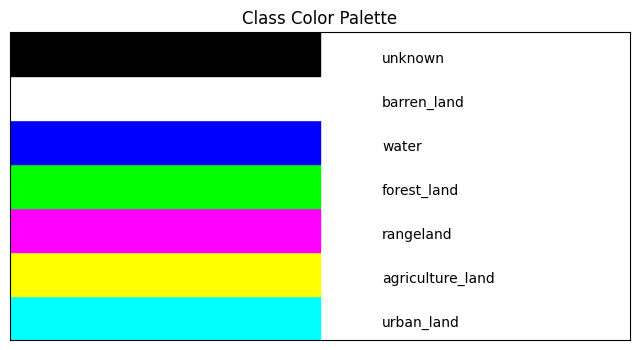

In [ ]:
def plot_color_palette(class_colors, class_labels):
    """
    Plots a visual color palette showing each class's color and label.

    Args:
        class_colors (dict): A dictionary mapping class indices (int) to RGB color tuples,
                             e.g., {0: (0, 0, 0), 1: (255, 0, 0)}.
        class_labels (list): A list of class names corresponding to class indices,
                             where index i matches class_colors[i].

    The function creates a vertical legend-style visualization with colored boxes
    and class names, useful for interpreting colorized segmentation masks.
    """
    fig, ax = plt.subplots(figsize=(8, 4))
    for i, (class_idx, color) in enumerate(class_colors.items()):
        ax.add_patch(plt.Rectangle((0, i), 1, 1, color=np.array(color)/255.0))
        ax.text(1.2, i + 0.4, class_labels[i], verticalalignment='center')
    ax.set_xlim(0, 2)
    ax.set_ylim(0, len(class_colors))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title("Class Color Palette")
    plt.show()
class_labels = class_dict_df['name'].tolist()
plot_color_palette(class_colors, class_labels)


In [ ]:
#Hyperparameters
BATCH_SIZE = 24
NUM_WORKERS = 8
LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-4
EPOCHS = 15
SAVE_EVERY = 3

In [ ]:
model = smp.DeepLabV3Plus(encoder_name='resnet101', classes=len(class_dict_df), activation=None).cuda()

criterion1 = smp.losses.LovaszLoss(mode='multiclass', ignore_index=6)
criterion2 = smp.losses.SoftCrossEntropyLoss(smooth_factor=0.05, ignore_index=6)
criterion3 = smp.losses.DiceLoss(mode="multiclass", ignore_index=6)

#Composite loss function
def criterion(output, target):
    return 0.4 * criterion1(output, target) + 0.4 * criterion2(output, target) + 0.2 * criterion3(output, target)

optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

scaler = GradScaler()

config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/179M [00:00<?, ?B/s]

In [ ]:
def get_now():
  return datetime.now().strftime("%Y-%m-%d-%H:%M:%S")

def add_logger(log_directory="tensorboard_logs"):
  log_dir = os.path.join(save_base_path,log_directory)
  os.makedirs(log_dir, exist_ok=True)

  writer = SummaryWriter(log_dir=log_dir)
  return writer
writer = add_logger()

In [ ]:
now = get_now()
print("Current Time:", now)

Current Time: 2025-05-04-15:18:00


In [ ]:
class_labels = {
    0: "Urban",
    1: "Agriculture",
    2: "Rangeland",
    3: "Forest",
    4: "Water",
    5: "Barren",
    6: "Unknown"
}

In [ ]:
def validate(model, dataloader, criterion, device, epoch, writer=None):
    model.eval()
    total_loss = 0.0
    num_batches = 0

    num_classes = model.segmentation_head[0].out_channels


    iou_metric = JaccardIndex(task='multiclass', num_classes=num_classes, ignore_index=6).to(device)
    f1_metric = F1Score(task='multiclass', num_classes=num_classes, average='macro', ignore_index=6).to(device)
    prec_metric = Precision(task='multiclass', num_classes=num_classes, average='macro', ignore_index=6).to(device)
    conf_metric = ConfusionMatrix(task='multiclass', num_classes=num_classes, normalize='true').to(device)
    iou_per_class = JaccardIndex(task='multiclass', num_classes=num_classes, average=None, ignore_index=6).to(device)

    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.cuda(), masks.cuda()
            outputs = model(images)
            loss = criterion(outputs, masks)
            total_loss += loss.item()


            preds = torch.argmax(outputs.detach(), dim=1).long()
            masks_detached = masks.detach()

            iou_metric.update(preds, masks_detached)
            f1_metric.update(preds, masks_detached)
            prec_metric.update(preds, masks_detached)
            conf_metric.update(preds, masks_detached)
            iou_per_class.update(preds, masks_detached)

            num_batches += 1

    avg_loss = total_loss / num_batches
    avg_iou = iou_metric.compute().item()
    avg_f1 = f1_metric.compute().item()
    avg_prec = prec_metric.compute().item()
    conf_matrix = conf_metric.compute().cpu().numpy()
    iou_per_class_values = iou_per_class.compute().cpu().numpy()


    print("="*70)
    print(f"[Validation] Epoch {epoch + 1}")
    print(f"  Avg Loss        : {avg_loss:.4f}")
    print(f"  IoU (macro)     : {avg_iou:.4f}")
    print(f"  F1 Score (macro): {avg_f1:.4f}")
    print(f"  Precision (macro): {avg_prec:.4f}")
    print("\nPer-Class IoU:")
    for i, iou in enumerate(iou_per_class_values):
        if i == 6: continue
        label = class_labels.get(i, f"Class {i}")
        print(f"  {label:<12}: {iou:.4f}")



    if writer:
      writer.add_scalar("Val/Loss", avg_loss, epoch)
      writer.add_scalar("Val/IoU_macro", avg_iou, epoch)
      writer.add_scalar("Val/F1_macro", avg_f1, epoch)
      writer.add_scalar("Val/Precision_macro", avg_prec, epoch)
      for i, iou in enumerate(iou_per_class_values):
        if i != 6:
          writer.add_scalar(f"Val/IoU_Class_{i}", iou, epoch)


      fig, ax = plt.subplots(figsize=(6, 6))
      sns.heatmap(conf_matrix, annot=True, fmt=".2f", cmap="Blues", ax=ax)
      ax.set_title("Confusion Matrix")
      ax.set_xlabel("Predicted")
      ax.set_ylabel("Actual")
      writer.add_figure("Val/ConfusionMatrix", fig, epoch)
      plt.close(fig)

    del loss, outputs, preds
    torch.cuda.empty_cache()
    gc.collect()

    return avg_loss, avg_iou

In [ ]:
def train_model(model, dataloader, val_loader, criterion, optimizer, epochs=EPOCHS, writer=None):
    model.train()
    best_val_score = 0.0

    for epoch in range(epochs):
        running_loss = 0.0
        pbar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}", leave=False)
        for images, masks in pbar:
            images, masks = images.cuda(), masks.cuda()

            optimizer.zero_grad()
            with autocast():
                outputs = model(images)
                loss = criterion(outputs, masks)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            running_loss += loss.item()
            pbar.set_postfix(loss=loss.item())
        avg_loss = running_loss / len(dataloader)

        writer.add_scalar("Training Loss", avg_loss, epoch)
        writer.add_scalar("Learning Rate", optimizer.param_groups[0]['lr'], epoch)

        val_loss, val_iou = validate(model, val_loader, criterion, device="cuda", epoch=epoch, writer=writer)

        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_loss:.4f}, Val Loss: {val_loss:.4f}, Val IoU: {val_iou:.4f}")


        lr_scheduler.step(avg_loss)

        # Save the best model
        val_score = val_iou*0.7 + (1-val_loss)*0.3
        if val_score > best_val_score:
            best_val_score = val_score
            best_model_path = os.path.join(save_base_path, f"best_model_epoch_{epoch+1}.pth")
            torch.save(model.state_dict(), best_model_path)
            print(f"Best model saved at epoch {epoch+1} with a combined score of: {val_score:.4f}")


        # Save the model every 'SAVE_EVERY' epochs
        if (epoch + 1) % SAVE_EVERY == 0:
            now = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

            save_path = os.path.join(save_base_path, f"model_epoch_at_{now}_{epoch+1}.pth")
            torch.save(model.state_dict(), save_path)
            print(f"Model saved at {save_path}")
        print("="*70)

    print("Training complete!")

In [ ]:
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
train_model(model, dataloader,val_loader, criterion, optimizer, epochs=EPOCHS, writer=writer)

[Validation] Epoch 1
  Avg Loss        : 0.4650
  IoU (macro)     : 0.7202
  F1 Score (macro): 0.8281
  Precision (macro): 0.8263

Per-Class IoU:
  Urban       : 0.7750
  Agriculture : 0.8709
  Rangeland   : 0.4260
  Forest      : 0.7802
  Water       : 0.8038
  Barren      : 0.6654
Epoch 1/15, Train Loss: 0.4922, Val Loss: 0.4650, Val IoU: 0.7202
Best model saved at epoch 1 with a combined score of: 0.6647


[Validation] Epoch 2
  Avg Loss        : 0.4602
  IoU (macro)     : 0.7072
  F1 Score (macro): 0.8176
  Precision (macro): 0.8103

Per-Class IoU:
  Urban       : 0.7647
  Agriculture : 0.8632
  Rangeland   : 0.3891
  Forest      : 0.7780
  Water       : 0.7893
  Barren      : 0.6592
Epoch 2/15, Train Loss: 0.4714, Val Loss: 0.4602, Val IoU: 0.7072


[Validation] Epoch 3
  Avg Loss        : 0.4562
  IoU (macro)     : 0.7136
  F1 Score (macro): 0.8222
  Precision (macro): 0.8239

Per-Class IoU:
  Urban       : 0.7679
  Agriculture : 0.8761
  Rangeland   : 0.4039
  Forest      : 0.7405
  Water       : 0.8339
  Barren      : 0.6593
Epoch 3/15, Train Loss: 0.4006, Val Loss: 0.4562, Val IoU: 0.7136
Model saved at /content/drive/MyDrive/finalyearproject/save-resnet101-816-may4-25val/model_epoch_at_2025-05-04 16:54:37_3.pth


[Validation] Epoch 4
  Avg Loss        : 0.4181
  IoU (macro)     : 0.7537
  F1 Score (macro): 0.8528
  Precision (macro): 0.8492

Per-Class IoU:
  Urban       : 0.7898
  Agriculture : 0.8870
  Rangeland   : 0.4932
  Forest      : 0.8190
  Water       : 0.8256
  Barren      : 0.7078
Epoch 4/15, Train Loss: 0.3829, Val Loss: 0.4181, Val IoU: 0.7537
Best model saved at epoch 4 with a combined score of: 0.7022


[Validation] Epoch 5
  Avg Loss        : 0.4168
  IoU (macro)     : 0.7570
  F1 Score (macro): 0.8549
  Precision (macro): 0.8688

Per-Class IoU:
  Urban       : 0.7696
  Agriculture : 0.8931
  Rangeland   : 0.4940
  Forest      : 0.8053
  Water       : 0.8502
  Barren      : 0.7295
Epoch 5/15, Train Loss: 0.3674, Val Loss: 0.4168, Val IoU: 0.7570
Best model saved at epoch 5 with a combined score of: 0.7048


[Validation] Epoch 6
  Avg Loss        : 0.4088
  IoU (macro)     : 0.7642
  F1 Score (macro): 0.8596
  Precision (macro): 0.8709

Per-Class IoU:
  Urban       : 0.7912
  Agriculture : 0.8973
  Rangeland   : 0.5116
  Forest      : 0.8294
  Water       : 0.8616
  Barren      : 0.6939
Epoch 6/15, Train Loss: 0.3619, Val Loss: 0.4088, Val IoU: 0.7642
Best model saved at epoch 6 with a combined score of: 0.7123
Model saved at /content/drive/MyDrive/finalyearproject/save-resnet101-816-may4-25val/model_epoch_at_2025-05-04 17:28:35_6.pth


[Validation] Epoch 7
  Avg Loss        : 0.4037
  IoU (macro)     : 0.7666
  F1 Score (macro): 0.8618
  Precision (macro): 0.8576

Per-Class IoU:
  Urban       : 0.7945
  Agriculture : 0.8946
  Rangeland   : 0.5157
  Forest      : 0.8192
  Water       : 0.8553
  Barren      : 0.7206
Epoch 7/15, Train Loss: 0.3492, Val Loss: 0.4037, Val IoU: 0.7666
Best model saved at epoch 7 with a combined score of: 0.7155


[Validation] Epoch 8
  Avg Loss        : 0.4145
  IoU (macro)     : 0.7607
  F1 Score (macro): 0.8572
  Precision (macro): 0.8709

Per-Class IoU:
  Urban       : 0.7863
  Agriculture : 0.8931
  Rangeland   : 0.4958
  Forest      : 0.7918
  Water       : 0.8680
  Barren      : 0.7293
Epoch 8/15, Train Loss: 0.3424, Val Loss: 0.4145, Val IoU: 0.7607


[Validation] Epoch 9
  Avg Loss        : 0.3980
  IoU (macro)     : 0.7738
  F1 Score (macro): 0.8669
  Precision (macro): 0.8748

Per-Class IoU:
  Urban       : 0.8021
  Agriculture : 0.9019
  Rangeland   : 0.5317
  Forest      : 0.8012
  Water       : 0.8625
  Barren      : 0.7436
Epoch 9/15, Train Loss: 0.3367, Val Loss: 0.3980, Val IoU: 0.7738
Best model saved at epoch 9 with a combined score of: 0.7223
Model saved at /content/drive/MyDrive/finalyearproject/save-resnet101-816-may4-25val/model_epoch_at_2025-05-04 18:02:35_9.pth


[Validation] Epoch 10
  Avg Loss        : 0.3863
  IoU (macro)     : 0.7812
  F1 Score (macro): 0.8716
  Precision (macro): 0.8738

Per-Class IoU:
  Urban       : 0.8092
  Agriculture : 0.9012
  Rangeland   : 0.5340
  Forest      : 0.8418
  Water       : 0.8522
  Barren      : 0.7490
Epoch 10/15, Train Loss: 0.3276, Val Loss: 0.3863, Val IoU: 0.7812
Best model saved at epoch 10 with a combined score of: 0.7310


[Validation] Epoch 11
  Avg Loss        : 0.3838
  IoU (macro)     : 0.7891
  F1 Score (macro): 0.8774
  Precision (macro): 0.8909

Per-Class IoU:
  Urban       : 0.8111
  Agriculture : 0.9079
  Rangeland   : 0.5671
  Forest      : 0.8351
  Water       : 0.8691
  Barren      : 0.7443
Epoch 11/15, Train Loss: 0.3224, Val Loss: 0.3838, Val IoU: 0.7891
Best model saved at epoch 11 with a combined score of: 0.7372


[Validation] Epoch 12
  Avg Loss        : 0.3624
  IoU (macro)     : 0.8066
  F1 Score (macro): 0.8887
  Precision (macro): 0.8854

Per-Class IoU:
  Urban       : 0.8157
  Agriculture : 0.9130
  Rangeland   : 0.5873
  Forest      : 0.8571
  Water       : 0.8874
  Barren      : 0.7789
Epoch 12/15, Train Loss: 0.3176, Val Loss: 0.3624, Val IoU: 0.8066
Best model saved at epoch 12 with a combined score of: 0.7559
Model saved at /content/drive/MyDrive/finalyearproject/save-resnet101-816-may4-25val/model_epoch_at_2025-05-04 18:36:35_12.pth


[Validation] Epoch 13
  Avg Loss        : 0.3677
  IoU (macro)     : 0.8006
  F1 Score (macro): 0.8846
  Precision (macro): 0.8769

Per-Class IoU:
  Urban       : 0.8194
  Agriculture : 0.9085
  Rangeland   : 0.5672
  Forest      : 0.8411
  Water       : 0.8854
  Barren      : 0.7822
Epoch 13/15, Train Loss: 0.3093, Val Loss: 0.3677, Val IoU: 0.8006


[Validation] Epoch 14
  Avg Loss        : 0.3595
  IoU (macro)     : 0.8112
  F1 Score (macro): 0.8920
  Precision (macro): 0.8936

Per-Class IoU:
  Urban       : 0.8187
  Agriculture : 0.9148
  Rangeland   : 0.6052
  Forest      : 0.8588
  Water       : 0.8865
  Barren      : 0.7832
Epoch 14/15, Train Loss: 0.3127, Val Loss: 0.3595, Val IoU: 0.8112
Best model saved at epoch 14 with a combined score of: 0.7600


[Validation] Epoch 15
  Avg Loss        : 0.3595
  IoU (macro)     : 0.8073
  F1 Score (macro): 0.8898
  Precision (macro): 0.9006

Per-Class IoU:
  Urban       : 0.8205
  Agriculture : 0.9200
  Rangeland   : 0.6142
  Forest      : 0.8225
  Water       : 0.8985
  Barren      : 0.7678
Epoch 15/15, Train Loss: 0.2945, Val Loss: 0.3595, Val IoU: 0.8073
Model saved at /content/drive/MyDrive/finalyearproject/save-resnet101-816-may4-25val/model_epoch_at_2025-05-04 19:10:37_15.pth
Training complete!


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/finalyearproject/save-resnet101-816-may4-15val/tensorboard_logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>